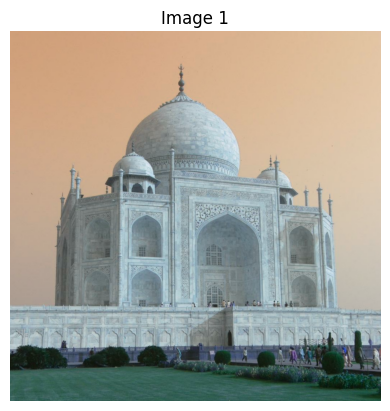

In [3]:
import cv2
import matplotlib.pyplot as plt

# Load the image (replace 'image_path' with your actual image file path)
image1 = cv2.imread('/kaggle/input/matching/train/taj_mahal/09450353_5172139772.jpg')
plt.imshow(image1)
plt.title('Image 1')

plt.axis('off')
plt.show()

In [6]:
import numpy as np
from scipy.fftpack import dct, idct
import matplotlib.pyplot as plt

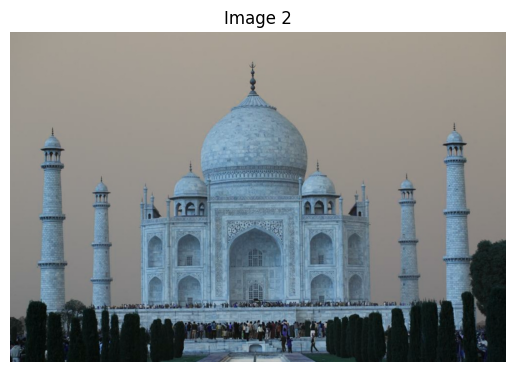

In [4]:
image2 = cv2.imread('/kaggle/input/matching/train/taj_mahal/12757988_6488356199.jpg')
plt.imshow(image2)
plt.title('Image 2')
plt.axis('off')
plt.show()

# **JPEG Compressor**

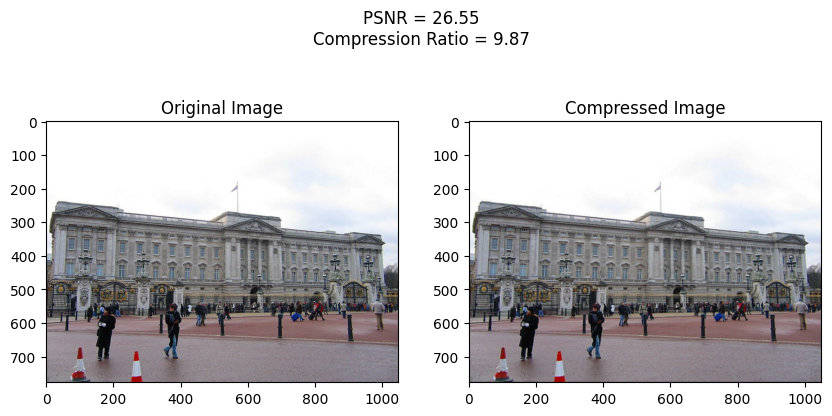

In [15]:
# Import the required modules
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import os

from PIL import Image

# Define the quantization matrix
quantization_matrix = np.array(
    [
        [16, 11, 10, 16, 24, 40, 51, 61],
        [12, 12, 14, 19, 26, 58, 60, 55],
        [14, 13, 16, 24, 40, 57, 69, 56],
        [14, 17, 22, 29, 51, 87, 80, 62],
        [18, 22, 37, 56, 68, 109, 103, 77],
        [24, 35, 55, 64, 81, 104, 113, 92],
        [49, 64, 78, 87, 103, 121, 120, 101],
        [72, 92, 95, 98, 112, 100, 103, 99],
    ],
    dtype=np.float32,
)


def calculate_psnr(img1: np.ndarray[np.uint8], img2: np.ndarray[np.uint8]) -> float:
    
    mse = np.mean((img1 - img2) ** 2)
    psnr = 20 * np.log10(255 / np.sqrt(mse))
    return psnr


def number_of_elements(blocks: list[np.ndarray[np.int32]]) -> int:

    total_elements = 0
    for block in blocks:
        # Trim the trailing zeros from the 1D array
        total_elements += np.trim_zeros(block, "b").size
    return total_elements


def total_number_of_elements(
    blocks: list[np.ndarray[np.int32]]
    | tuple[
        list[np.ndarray[np.int32]],
        list[np.ndarray[np.int32]],
        list[np.ndarray[np.int32]],
    ],
    color: bool,
) -> int:
    
    total_elements = 0
    if color:
        # Add the number of elements for each color channel
        total_elements = (
            number_of_elements(blocks[0])
            + number_of_elements(blocks[1])
            + number_of_elements(blocks[2])
        )
    else:
        total_elements = number_of_elements(blocks)
    return total_elements


def zigzag_scan(block: np.ndarray[np.int32]) -> np.ndarray[np.int32]:

    block_size = block.shape[0]
    zigzag_arr = np.concatenate(
        [
            np.diagonal(block[::-1, :], i)[:: (2 * (i % 2) - 1)]
            for i in range(1 - block_size, block_size)
        ]
    )
    return zigzag_arr


def zigzag_unscan(
    zigzag_arr: np.ndarray[np.int32], block_size: int
) -> np.ndarray[np.float32]:
    """Unscans a 1D array in zigzag order and return a 2D array"""
    # Create an empty 2D array to store the unscanned values
    block = np.zeros((block_size, block_size), dtype=np.float32)
    x, y = 0, 0
    for num in zigzag_arr:
        # Set the current value in the corresponding coordinate of the 2D array
        block[x, y] = num

        # Determine the direction to move based on the current position
        # if the sum of the coordinates is even
        if (x + y) % 2 == 0:
            # if at the last column, move down one row
            if y == block_size - 1:
                x += 1
            # if at the first row, move right one column
            elif x == 0:
                y += 1
            # otherwise move up one row and right one column
            else:
                x -= 1
                y += 1
        # if the sum of the coordinates is odd
        else:
            # if at the last row, move right one column
            if x == block_size - 1:
                y += 1
            # if at the first column, move down one row
            elif y == 0:
                x += 1
            # otherwise move down one row and left one column
            else:
                x += 1
                y -= 1

    # return the 2D array with the unscanned values
    return block


def grayscale_jpeg_encoder(
    img: np.ndarray[np.uint8], block_size: int, num_coefficients: int
) -> list[np.ndarray[np.int32]]:

    # Pad the image to make it divisible by the block size
    height, width = img.shape
    padded_height = height + (block_size - height % block_size) % block_size
    padded_width = width + (block_size - width % block_size) % block_size
    padded_img = np.zeros((padded_height, padded_width), dtype=np.uint8)
    padded_img[:height, :width] = img

    # Subtract 128 from the image
    padded_img = padded_img.astype(np.float32) - 128

    # Split the image into blocks of the given size
    blocks = [
        padded_img[i : i + block_size, j : j + block_size]
        for i in range(0, padded_height, block_size)
        for j in range(0, padded_width, block_size)
    ]

    # Apply the Discrete Cosine Transform (DCT) to each block
    dct_blocks = [cv.dct(block) for block in blocks]

    # Resize the quantization matrix to match the block size
    resized_quantization_matrix = cv.resize(
        quantization_matrix, (block_size, block_size), cv.INTER_CUBIC
    )

    # Quantize each DCT coefficient by dividing with the resized quantization matrix
    quantized_blocks = [
        np.round(block / resized_quantization_matrix).astype(np.int32)
        for block in dct_blocks
    ]

    # Perform zigzag scanning on each quantized block
    zigzag_scanned_blocks = [zigzag_scan(block) for block in quantized_blocks]

    # Retain only the first `num_coefficients` coefficients in each block
    first_num_coefficients = [
        block[:num_coefficients] for block in zigzag_scanned_blocks
    ]

    return first_num_coefficients


def grayscale_jpeg_decoder(
    blocks: list[np.ndarray[np.int32]], img: np.ndarray[np.uint8], block_size: int
) -> np.ndarray[np.uint8]:
   
    # Calculated the padded height and width of the image
    height, width = img.shape
    padded_height = height + (block_size - height % block_size) % block_size
    padded_width = width + (block_size - width % block_size) % block_size

    # Resize the quantization matrix to match the block size
    resized_quantization_matrix = cv.resize(
        quantization_matrix, (block_size, block_size), cv.INTER_CUBIC
    )

    # Unscan the zigzag scanned blocks to get the quantized blocks
    zigzag_unscanned_blocks = [zigzag_unscan(block, block_size) for block in blocks]

    # Dequantize the quantized blocks using the resized quantization matrix
    dequantized_blocks = [
        block * resized_quantization_matrix for block in zigzag_unscanned_blocks
    ]

    # Apply the Inverse Discrete Cosine Transform (IDCT) to each dequantized block
    idct_blocks = [cv.idct(block) for block in dequantized_blocks]

    # Reconstruct the compressed image from the IDCT blocks
    compressed_img = np.zeros((padded_height, padded_width), dtype=np.float32)
    block_index = 0
    for i in range(0, padded_height, block_size):
        for j in range(0, padded_width, block_size):
            compressed_img[i : i + block_size, j : j + block_size] = idct_blocks[
                block_index
            ]
            block_index += 1

    compressed_img += 128

    # Crop the image back to its original size
    compressed_img = np.clip(compressed_img, 0, 255)
    return compressed_img[:height, :width].astype(np.uint8)


def color_jpeg_encoder(
    img: np.ndarray[np.uint8], block_size: int, num_coefficients: int
) -> tuple[
    list[np.ndarray[np.int32]], list[np.ndarray[np.int32]], list[np.ndarray[np.int32]]
]:
   
    # Split the image into blue, green and red channels
    blue_channel, green_channel, red_channel = cv.split(img)

    # Encode each channel using grayscale_jpeg_encoder
    return (
        grayscale_jpeg_encoder(blue_channel, block_size, num_coefficients),
        grayscale_jpeg_encoder(green_channel, block_size, num_coefficients),
        grayscale_jpeg_encoder(red_channel, block_size, num_coefficients),
    )


def color_jpeg_decoder(
    blocks: tuple[
        list[np.ndarray[np.int32]],
        list[np.ndarray[np.int32]],
        list[np.ndarray[np.int32]],
    ],
    img: np.ndarray[np.uint8],
    block_size: int,
) -> np.ndarray[np.uint8]:
   
    # Split the grayscale image into its color channels
    blue_channel, green_channel, red_channel = cv.split(img)

    # Decode each color channel using grayscale_jpeg_decoder
    blue_channel = grayscale_jpeg_decoder(blocks[0], blue_channel, block_size)
    green_channel = grayscale_jpeg_decoder(blocks[1], green_channel, block_size)
    red_channel = grayscale_jpeg_decoder(blocks[2], red_channel, block_size)

    # Merge the decoded color channels into a color image
    return cv.merge((blue_channel, green_channel, red_channel))


def jpeg_encoder(
    img_path: str,
    block_size: int,
    num_coefficients: int,
    color: bool,
) -> (
    list[np.ndarray[np.int32]]
    | tuple[
        list[np.ndarray[np.int32]],
        list[np.ndarray[np.int32]],
        list[np.ndarray[np.int32]],
    ]
):

    if color:
        # Load color image and apply color JPEG encoder
        img = cv.imread(img_path, cv.IMREAD_COLOR)
        return color_jpeg_encoder(img, block_size, num_coefficients)
    else:
        # Load grayscale image and apply grayscale JPEG encoder
        img = cv.imread(img_path, cv.IMREAD_GRAYSCALE)
        return grayscale_jpeg_encoder(img, block_size, num_coefficients)


def jpeg_decoder(
    blocks: list[np.ndarray[np.int32]]
    | tuple[
        list[np.ndarray[np.int32]],
        list[np.ndarray[np.int32]],
        list[np.ndarray[np.int32]],
    ],
    img_path: str,
    block_size: int,
    color: bool,
) -> np.ndarray[np.uint8]:

    if color:
        img = cv.imread(img_path, cv.IMREAD_COLOR)
        return color_jpeg_decoder(blocks, img, block_size)
    else:
        img = cv.imread(img_path, cv.IMREAD_GRAYSCALE)
        return grayscale_jpeg_decoder(blocks, img, block_size)


def analyze_image(
    img_path: str, block_size: int, num_coefficients: int, color: bool
) -> tuple[
    np.ndarray[np.uint8],
    np.ndarray[np.uint8],
    float,
    float,
    list[np.ndarray[np.int32]]
    | tuple[
        list[np.ndarray[np.int32]],
        list[np.ndarray[np.int32]],
        list[np.ndarray[np.int32]],
    ],
    bool,
]:
    
    # Read the image
    img: np.ndarray[np.uint8] = None
    if color:
        img = cv.imread(img_path, cv.IMREAD_COLOR)
    else:
        img = cv.imread(img_path, cv.IMREAD_GRAYSCALE)

    # Encode the image using JPEG compression
    encoded_img = jpeg_encoder(img_path, block_size, num_coefficients, color)
#     print(encoded_im)

    # Decode the image using JPEG compression
    compressed_img = jpeg_decoder(encoded_img, img_path, block_size, color)
    # Save the compressed image
    compressed_img_pil = Image.fromarray(compressed_img)
    compressed_img_pil.save('a.jpg')

    # Calculate the PSNR between the original and compressed images
    psnr = cv.PSNR(img, compressed_img)
  
    # Calculate the compression ratio
    n2 = total_number_of_elements(encoded_img, color)
    if n2 == 0:
        # In this case, the compression ratio is very high
        # But, we set it to 0 to avoid division by 0 so that our analysis becomes easier
        compression_ratio = 0
    else:
        compression_ratio = img.size / total_number_of_elements(encoded_img, color)

    # Return the original image, compressed image, PSNR, and compression ratio
    # Also return the encoded image and whether the image is color or not
    # The encoded image is returned so that it can be written in a text file
    return (img, compressed_img, psnr, compression_ratio, encoded_img, color)


def plot_images(
    img: np.ndarray[np.uint8],
    compressed_img: np.ndarray[np.uint8],
    psnr: float,
    compression_ratio: float,
    encoded_img: list[np.ndarray[np.int32]]
    | tuple[
        list[np.ndarray[np.int32]],
        list[np.ndarray[np.int32]],
        list[np.ndarray[np.int32]],
    ],
    color: bool,
) -> None:
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    fig.suptitle(
        "PSNR = {:.2f}\nCompression Ratio = {:.2f}".format(psnr, compression_ratio)
    )

    with open("encoded_image.txt", "w") as f:
        if color:
    # Plot original color image
            axs[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
            axs[0].set_title("Original Image")

            # Plot compressed color image
            axs[1].imshow(cv.cvtColor(compressed_img, cv.COLOR_BGR2RGB))
            axs[1].set_title("Compressed Image")



        else:
            axs[0].imshow(img, cmap="gray")
            axs[1].imshow(compressed_img, cmap="gray")
            for row in encoded_img:
                for element in row:
                    f.write(str(element) + " ")
                f.write("\n")

    axs[0].set_title("Original Image")

    axs[1].set_title("Compressed Image")
    plt.show()


def plot_graph(
    img_dir_path: str,
    color: bool,
):
    psnr_list = []
    compression_ratio_list = []
    for num_coefficients in [1, 3, 6, 10, 15, 28]:
        psnr_values = []
        compression_ratio_values = []
        for img_file in os.listdir(img_dir_path):
            img_path = os.path.join(img_dir_path, img_file)
            _, _, psnr, compression_ratio, _, _ = analyze_image(
                img_path, 8, num_coefficients, color
            )
            psnr_values.append(psnr)
            compression_ratio_values.append(compression_ratio)
        psnr_list.append(np.mean(psnr_values))
        compression_ratio_list.append(np.mean(compression_ratio_values))

    plt.plot(compression_ratio_list, psnr_list, "o")
    plt.xlabel("Compression Ratio")
    plt.ylabel("PSNR")
    plt.title("PSNR vs Compression Ratio")
    plt.show()



img_path = "/kaggle/input/matching/train/buckingham_palace/01693398_89866367.jpg"  # Replace with your image path
block_size = 8  # Choose an appropriate block size
num_coefficients =10
# Choose the number of coefficients
color = True  # Set to True if your image is color, False for grayscale
_,_,psnr,ratio,_,_=analyze_image(img_path, block_size, num_coefficients, color)
plot_images(*analyze_image(img_path, block_size, num_coefficients, color))


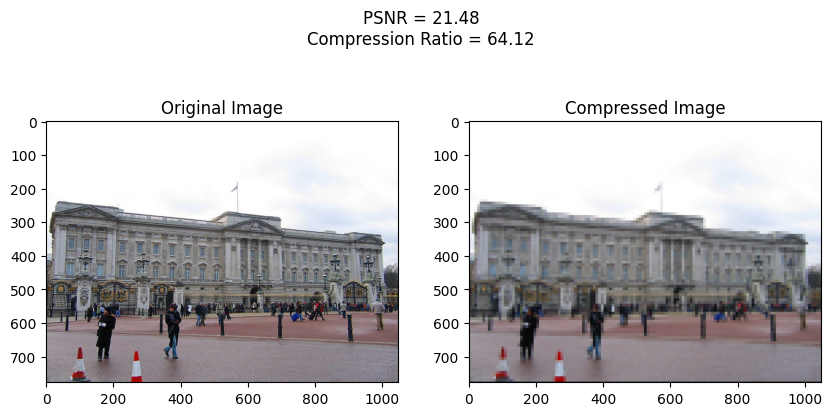

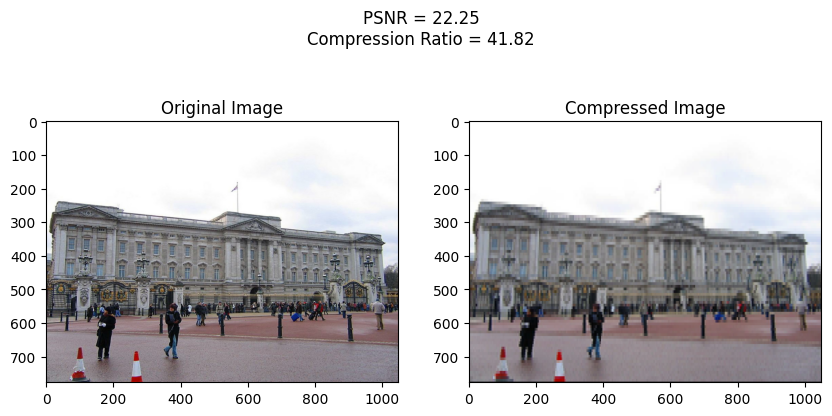

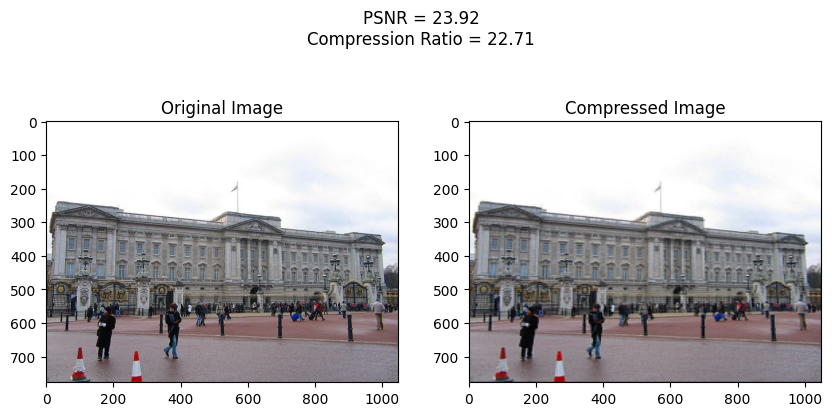

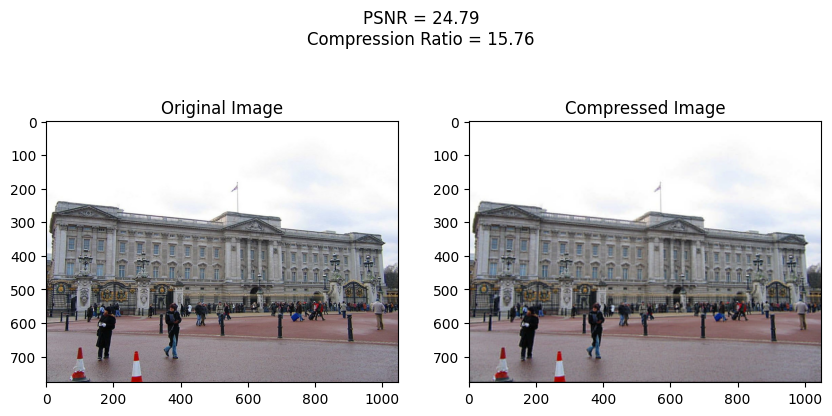

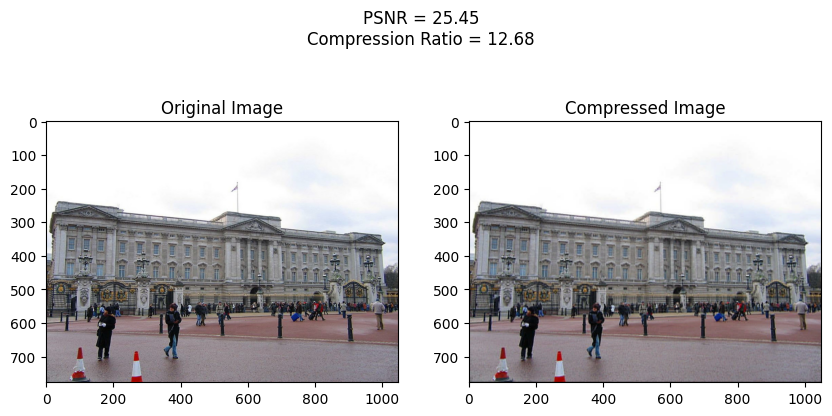

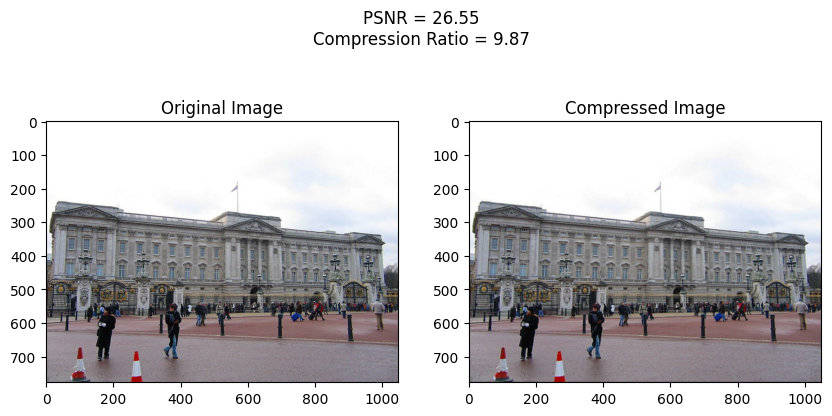

In [16]:
psnr_for_coefficients=[]
ratio_for_coefficients=[]
num_coefficients=[1,2,4,6,8,10]
for coeff in num_coefficients:
    color = True  # Set to True if your image is color, False for grayscale
    _,_,psnr,ratio,_,_=analyze_image(img_path, block_size, coeff, color)
    plot_images(*analyze_image(img_path, block_size, coeff, color))
    psnr_for_coefficients.append(psnr)
    ratio_for_coefficients.append(ratio)

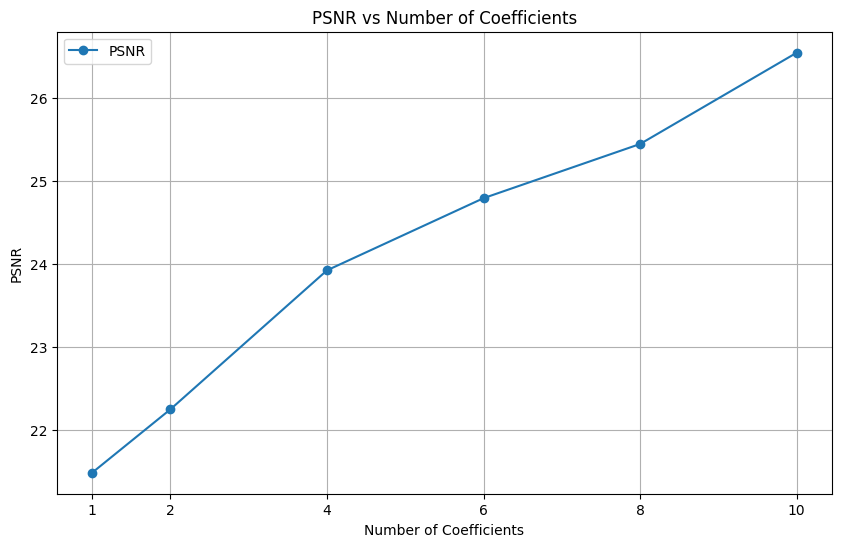

In [17]:
# Plotting the PSNR values against the number of coefficients
plt.figure(figsize=(10, 6))
plt.plot(num_coefficients, psnr_for_coefficients, marker='o', label='PSNR')
plt.xlabel('Number of Coefficients')
plt.ylabel('PSNR')
plt.title('PSNR vs Number of Coefficients')
plt.xticks(num_coefficients)  # Ensure all x-axis ticks are shown
plt.grid(True)
plt.legend()
plt.show()

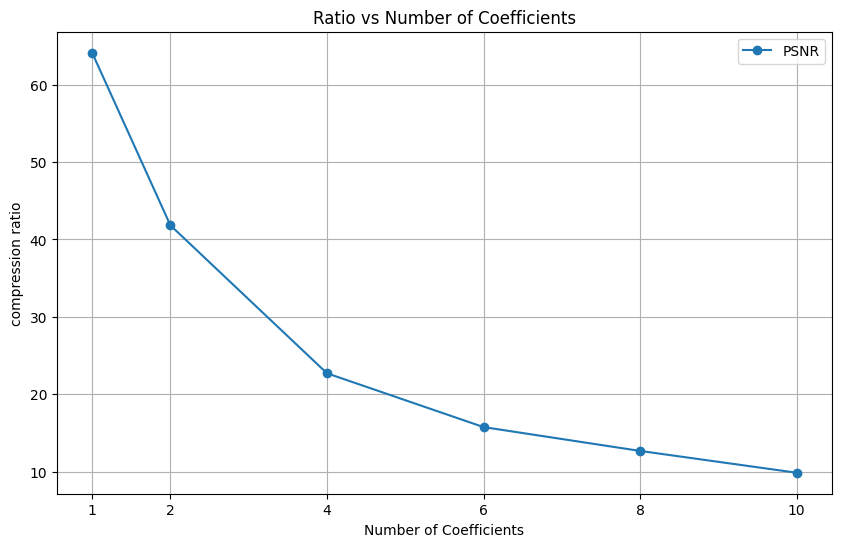

In [18]:
# Plotting the PSNR values against the number of coefficients
plt.figure(figsize=(10, 6))
plt.plot(num_coefficients, ratio_for_coefficients, marker='o', label='RATIO')
plt.xlabel('Number of Coefficients')
plt.ylabel('compression ratio')
plt.title('Ratio vs Number of Coefficients')
plt.xticks(num_coefficients)  # Ensure all x-axis ticks are shown
plt.grid(True)
plt.legend()
plt.show()

In [19]:
file_path = 'a.jpg'
file_size_kb = os.path.getsize(file_path) / 1024  # Convert bytes to kilobytes
print(f"Size of '{file_path}': {file_size_kb:.2f} KB")

Size of 'a.jpg': 67.09 KB


In [20]:
file_path = '/kaggle/input/matching/train/buckingham_palace/01693398_89866367.jpg'
file_size_kb = os.path.getsize(file_path) / 1024  # Convert bytes to kilobytes
print(f"Size of '{file_path}': {file_size_kb:.2f} KB")

Size of '/kaggle/input/matching/train/buckingham_palace/01693398_89866367.jpg': 477.09 KB


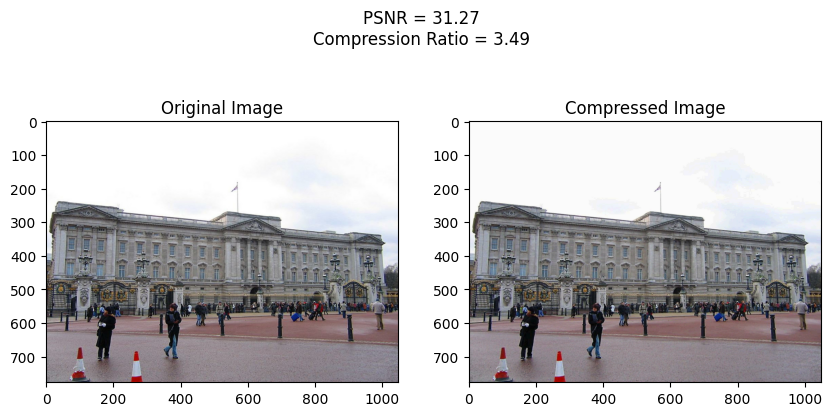

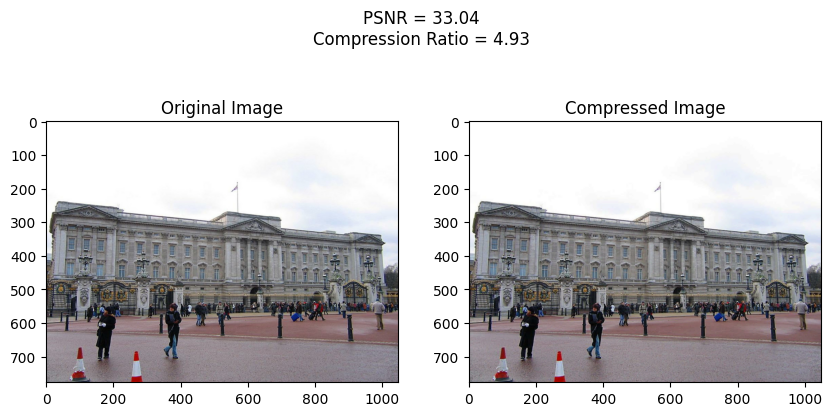

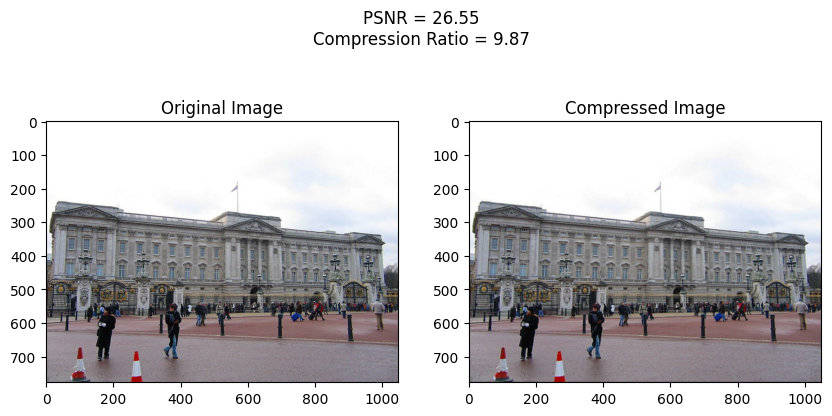

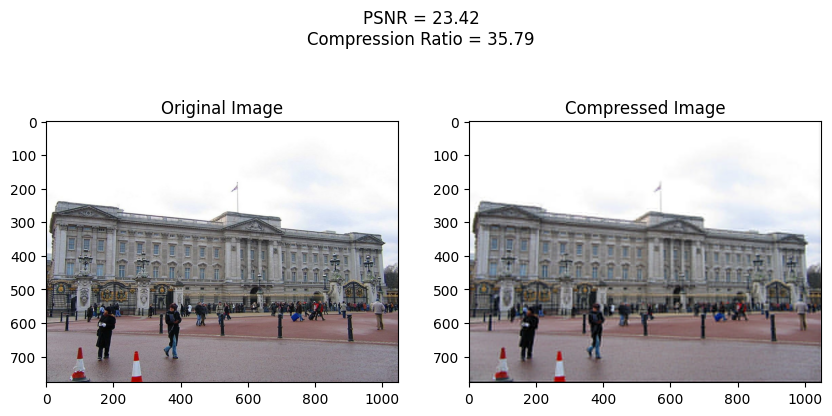

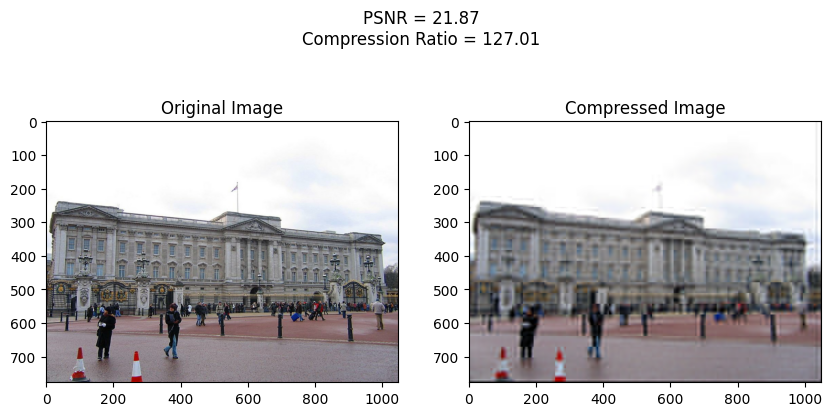

In [21]:
psnr_for_blocks=[]
ratio_for_blocks=[]
block_size=[2,4,8,16,32]
for block in block_size:
    color = True  # Set to True if your image is color, False for grayscale
    _,_,psnr,ratio,_,_=analyze_image(img_path, block, 10, color)
    plot_images(*analyze_image(img_path, block, 10, color))
    psnr_for_blocks.append(psnr)
    ratio_for_blocks.append(ratio)

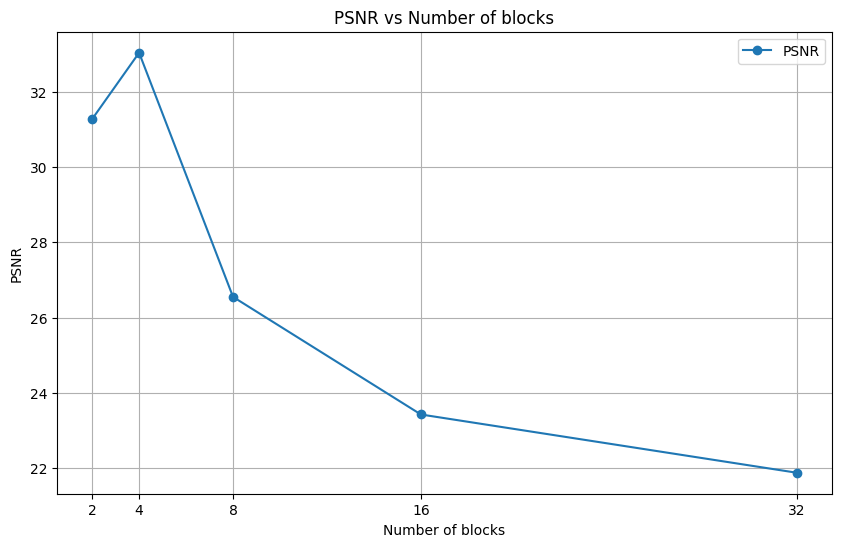

In [22]:
# Plotting the PSNR values against the number of coefficients
plt.figure(figsize=(10, 6))
plt.plot(block_size, psnr_for_blocks, marker='o', label='PSNR')
plt.xlabel('Number of blocks')
plt.ylabel('PSNR')
plt.title('PSNR vs Number of blocks')
plt.xticks(block_size)  # Ensure all x-axis ticks are shown
plt.grid(True)
plt.legend()
plt.show()

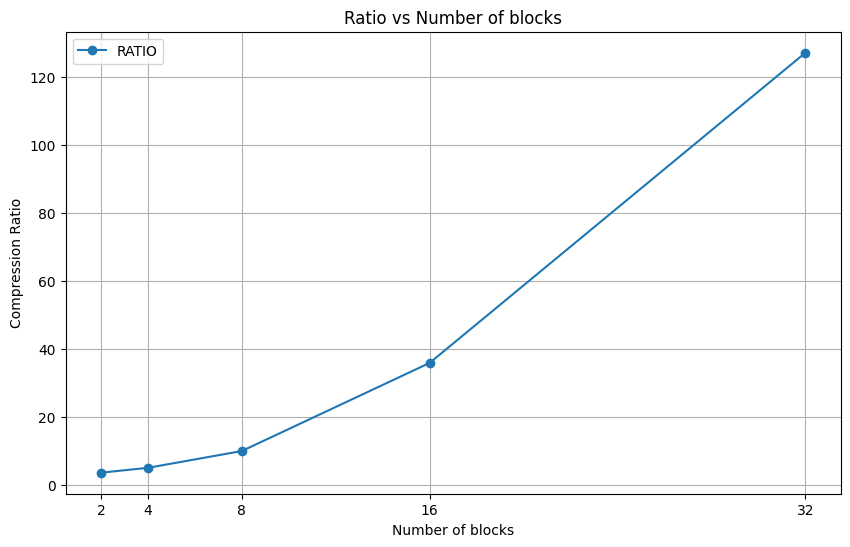

In [23]:
# Plotting the PSNR values against the number of coefficients
plt.figure(figsize=(10, 6))
plt.plot(block_size, ratio_for_blocks, marker='o', label='RATIO')
plt.xlabel('Number of blocks')
plt.ylabel('Compression Ratio')
plt.title('Ratio vs Number of blocks')
plt.xticks(block_size)  # Ensure all x-axis ticks are shown
plt.grid(True)
plt.legend()
plt.show()

Size of original image: 334.66 KB


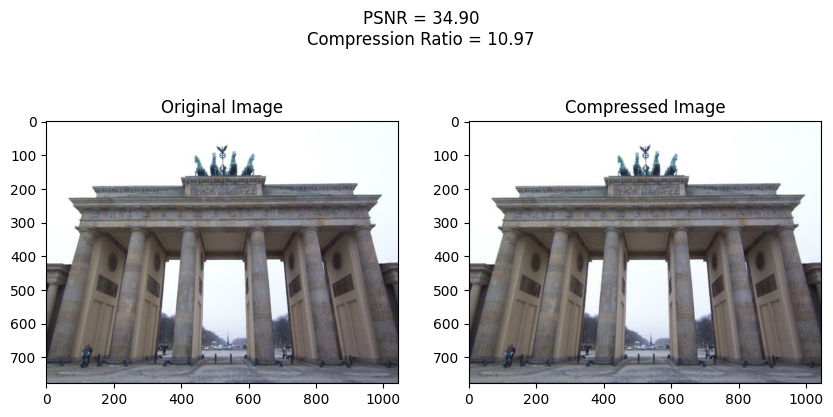

Size of compressed image: 56.86 KB


In [24]:
img_path = '/kaggle/input/matching/train/brandenburg_gate/02936509_94852264.jpg'
file_size_kb = os.path.getsize(img_path) / 1024  # Convert bytes to kilobytes
print(f"Size of original image: {file_size_kb:.2f} KB")

plot_images(*analyze_image(img_path, 8, 10, color))

file_path = 'a.jpg'
file_size_kb = os.path.getsize(file_path) / 1024  # Convert bytes to kilobytes
print(f"Size of compressed image: {file_size_kb:.2f} KB")

Size of original image: 423.20 KB


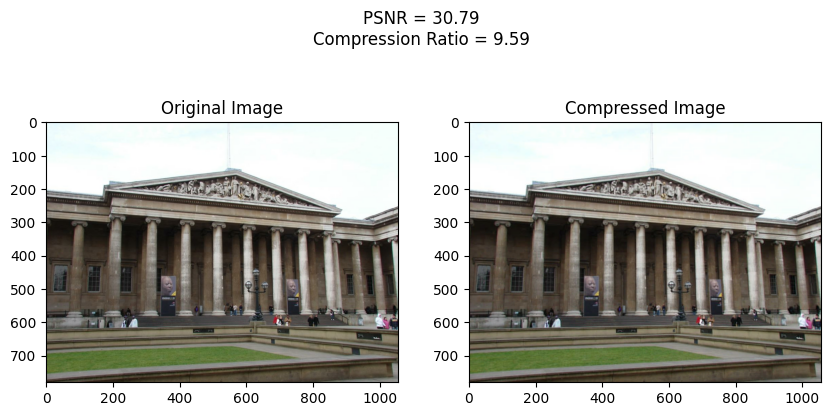

Size of compressed image: 68.80 KB


In [25]:
img_path = '/kaggle/input/matching/train/british_museum/24378750_4403814739.jpg'
file_size_kb = os.path.getsize(img_path) / 1024  # Convert bytes to kilobytes
print(f"Size of original image: {file_size_kb:.2f} KB")

plot_images(*analyze_image(img_path, 8, 10, color))

file_path = 'a.jpg'
file_size_kb = os.path.getsize(file_path) / 1024  # Convert bytes to kilobytes
print(f"Size of compressed image: {file_size_kb:.2f} KB")

Size of original image: 411.92 KB


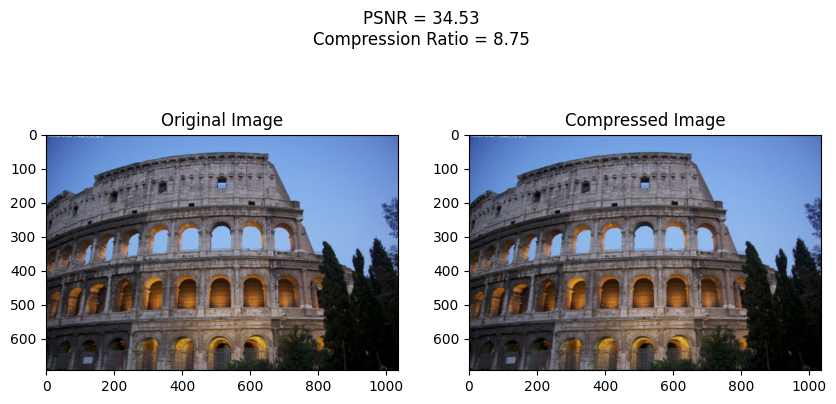

Size of compressed image: 67.52 KB


In [26]:
img_path = '/kaggle/input/matching/train/colosseum_exterior/01215002_7163576239.jpg'
file_size_kb = os.path.getsize(img_path) / 1024  # Convert bytes to kilobytes
print(f"Size of original image: {file_size_kb:.2f} KB")

plot_images(*analyze_image(img_path, 8, 10, color))

file_path = 'a.jpg'
file_size_kb = os.path.getsize(file_path) / 1024  # Convert bytes to kilobytes
print(f"Size of compressed image: {file_size_kb:.2f} KB")

Size of original image: 458.06 KB


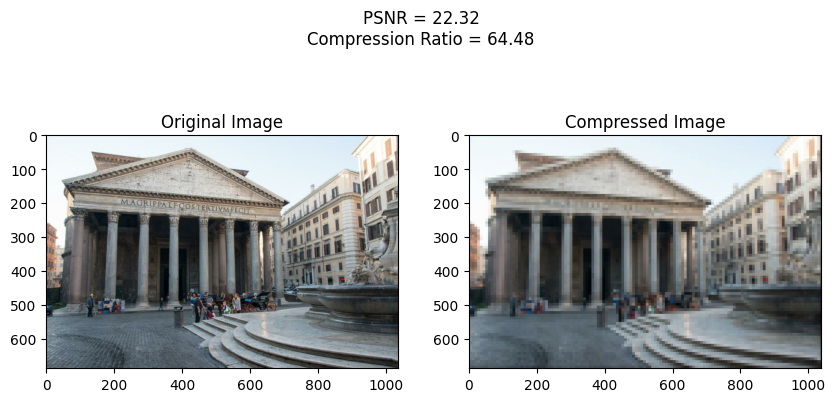

Size of compressed image: 21.42 KB


In [33]:
img_path = '/kaggle/input/matching/train/pantheon_exterior/00488011_10505838106.jpg'
file_size_kb = os.path.getsize(img_path) / 1024  # Convert bytes to kilobytes
print(f"Size of original image: {file_size_kb:.2f} KB")

plot_images(*analyze_image(img_path, 8, 1, color))

file_path = 'a.jpg'
file_size_kb = os.path.getsize(file_path) / 1024  # Convert bytes to kilobytes
print(f"Size of compressed image: {file_size_kb:.2f} KB")

# **IMAGE COMPRESSION USING BTC**

In [51]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math


def btc_block(img_block):
    """
    This function will calculate the coefficient and bitmap of the BTC Algorithm.
    """
    m = img_block.shape[0] * img_block.shape[1]
    h = float(np.sum(img_block) / (img_block.shape[0] * img_block.shape[1]))
    h2 = float(np.sum(img_block ** 2) / (img_block.shape[0] * img_block.shape[1]))
    sigma2 = np.var(img_block)
    sigma = np.std(img_block)
    q = img_block[np.where(img_block > h)].shape[0]
    if q == 0:
        # Handle the case when q is zero to avoid division by zero
        a = h - sigma * math.sqrt(float(q) / (m - q))
        b =  h + sigma * math.sqrt((m - q) / float(q+1))
    else:
        a = h - sigma * math.sqrt(float(q) / (m - q))
        b = h + sigma * math.sqrt((m - q) / float(q))
    
    bitmap = np.zeros((img_block.shape[0], img_block.shape[1]))
    result = img_block.copy()
    for i in range(0, img_block.shape[0]):
        for j in range(0, img_block.shape[1]):
            if (img_block[i, j] >= h):
                bitmap[i, j] = 1
                result[i, j] = round(b, 0)
            else:
                result[i, j] = round(a, 0)
    return bitmap, result


def btc_manual(img, block):
    """
    This function will doing Block Truncation Coding of one entire image.
    """
    result = img.copy()
    bitmap = img.copy()
    count = 0
    for i in range(0, img.shape[0], block):
        for j in range(0, img.shape[1], block):
            bitmap[i: i + block, j: j + block], result[i: i + block, j: j + block] = btc_block(
                img[i: i + block, j: j + block])
            count += 1
    return bitmap, result

def btc_psnr(img1, img2):
    """
    This function will calculate the PSNR of two images.
    """
    mse = np.mean( (img1 - img2) ** 2 )
    print(mse)
    psnr = 0

    PIXEL_MAX = 255.0
    psnr=20 * math.log10(PIXEL_MAX / math.sqrt(mse))
    print('PSNR: {}'.format(psnr))
    fig, ax = plt.subplots(nrows=1, ncols=2)
    ax1 = plt.subplot(1, 2, 1)
    ax1.set_title("Original")
    ax1.imshow(img1, cmap='gray')

    ax2 = plt.subplot(1, 2, 2)
    ax2.set_title("Result")
    ax2.imshow(img2, cmap='gray')

    fig.set_figheight(7)
    fig.set_figwidth(14)
    plt.show()
    return psnr

def plot_save(image, name, size):
    """
    This function will plot and save the image.
    """
    cv2.imwrite(name, image)
    fig = plt.gcf()
    fig.set_figheight(size)
    fig.set_figwidth(size)
    plt.imshow(image, cmap='gray')
    plt.show()

In [37]:

image_real=cv2.imread('/kaggle/input/matching/train/buckingham_palace/01693398_89866367.jpg')

image = cv2.cvtColor(image_real, cv2.COLOR_BGR2GRAY)

In [38]:
%time bitmap, result = btc_manual(image, 8)

CPU times: user 7.42 s, sys: 64.1 ms, total: 7.49 s
Wall time: 7.43 s


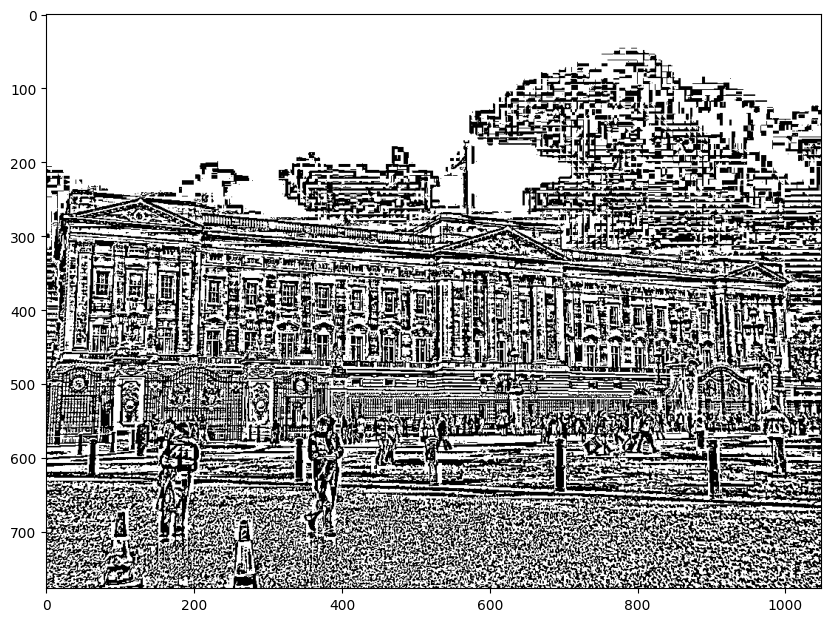

In [47]:
plot_save(bitmap, 'BTC_Bitmap.jpg', 10)

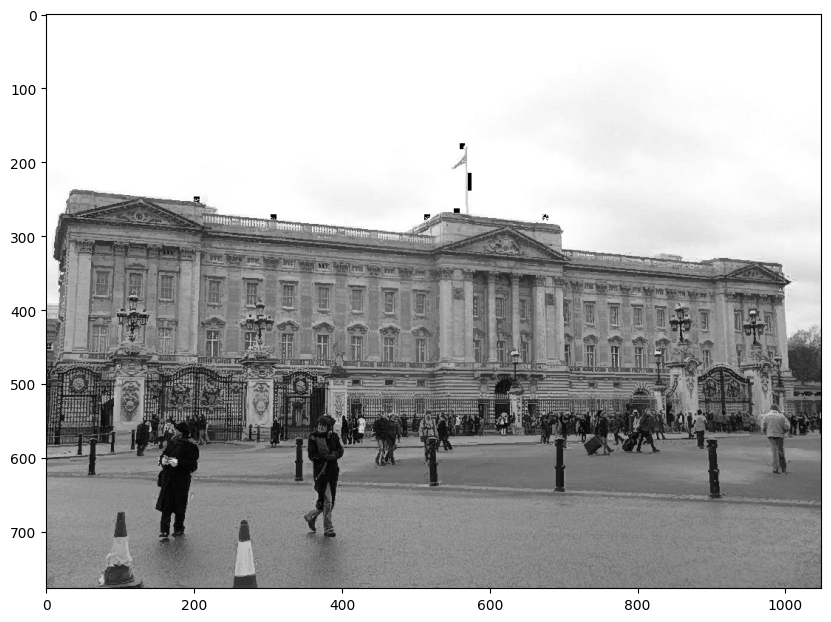

In [48]:
plot_save(result, 'BTC_Result.jpg', 10)

In [50]:
file_path1 = '/kaggle/input/matching/train/buckingham_palace/01693398_89866367.jpg'
file_size_kb1 = os.path.getsize(file_path1) / 1024  # Convert bytes to kilobytes
print(f"Size of original image: {file_size_kb1:.2f} KB")
file_path2 = 'BTC_Bitmap.png'
file_size_kb2 = os.path.getsize(file_path2) / 1024  # Convert bytes to kilobytes
print(f"Size of generated bitmap: {file_size_kb2:.2f} KB")
file_path3 = 'BTC_Result.jpg'
file_size_kb3 = os.path.getsize(file_path3) / 1024  # Convert bytes to kilobytes
print(f"Size of compressed image:  {file_size_kb3:.2f} KB")

Size of original image: 477.09 KB
Size of generated bitmap: 99.71 KB
Size of compressed image:  275.49 KB


33.3966491344947
PSNR: 32.89377466972611


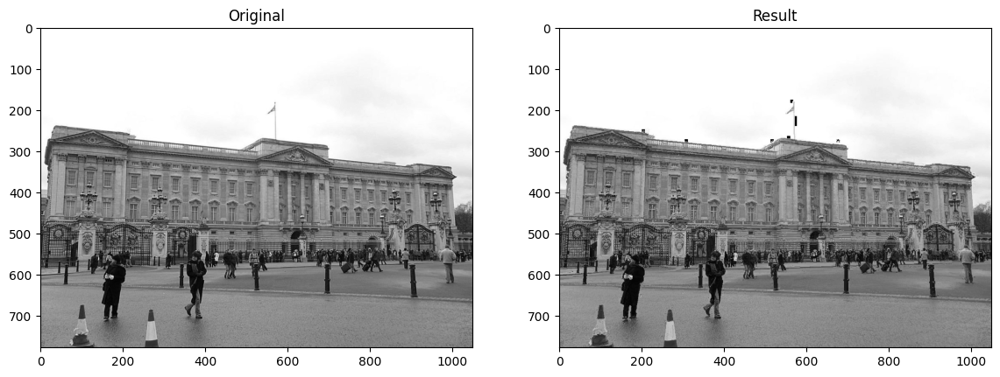

In [52]:
psnr=btc_psnr(image, result)


8.429057274624482
PSNR: 38.87301356032368


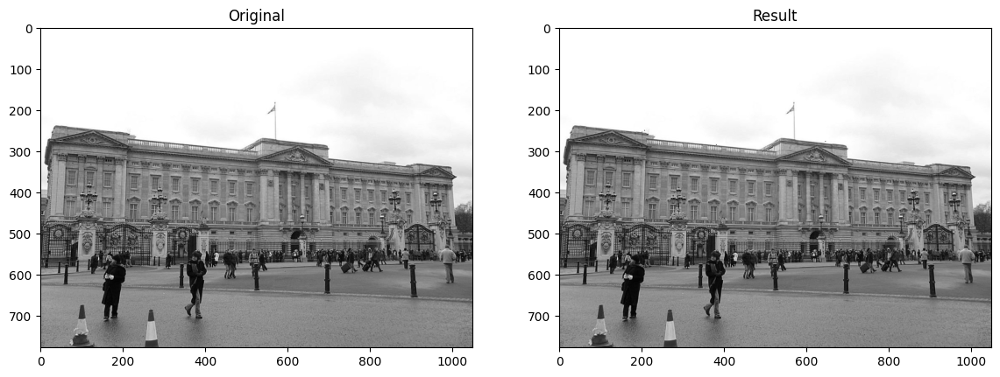

24.46007290144564
PSNR: 34.24622613783


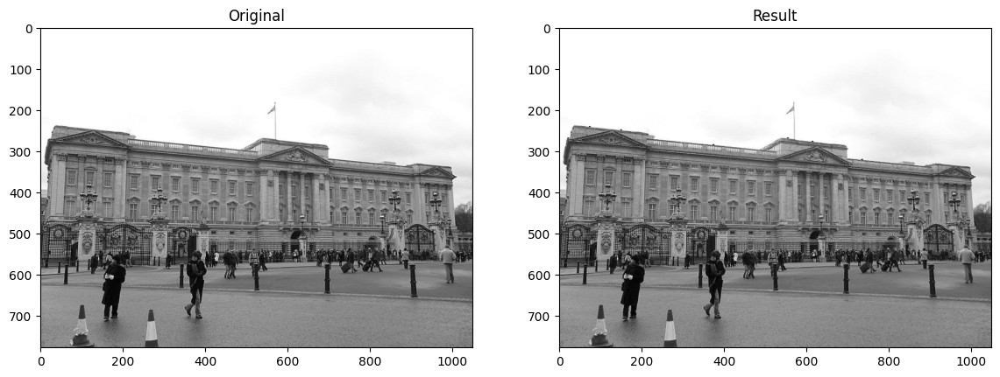

33.3966491344947
PSNR: 32.89377466972611


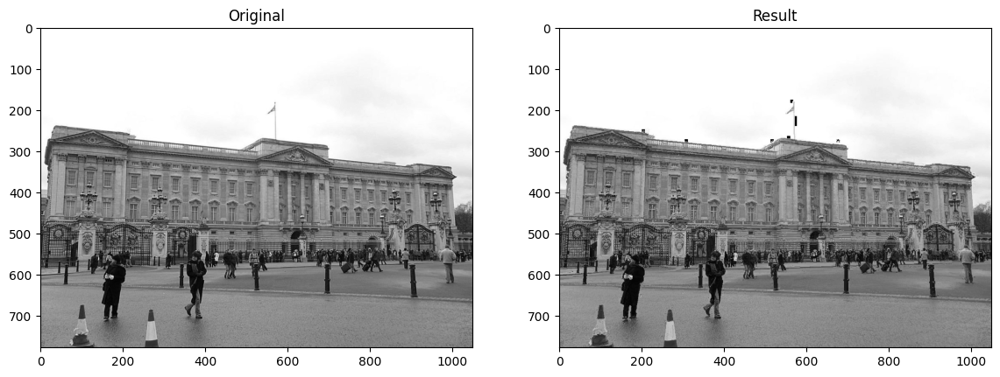

39.48667051908234
PSNR: 32.166298449118194


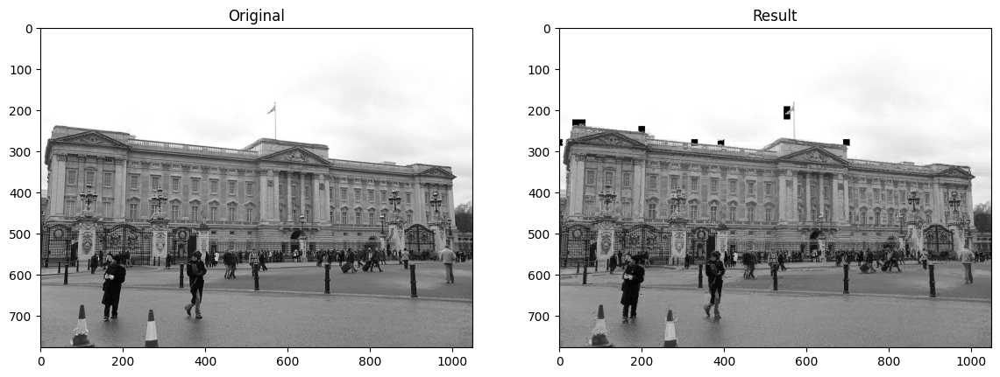

44.786934421824796
PSNR: 31.61929024014848


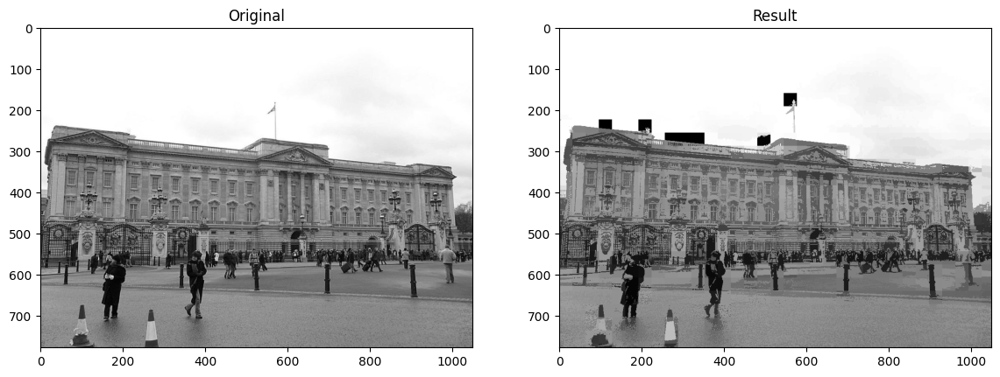

31.61929024014848


In [54]:
block_size=[2,4,8,16,32]
psnr_for_btc=[]
for block in block_size:
    bitmap, result = btc_manual(image, block)
    psnr=btc_psnr(image, result)
    psnr_for_btc.append(psnr)
print(psnr)

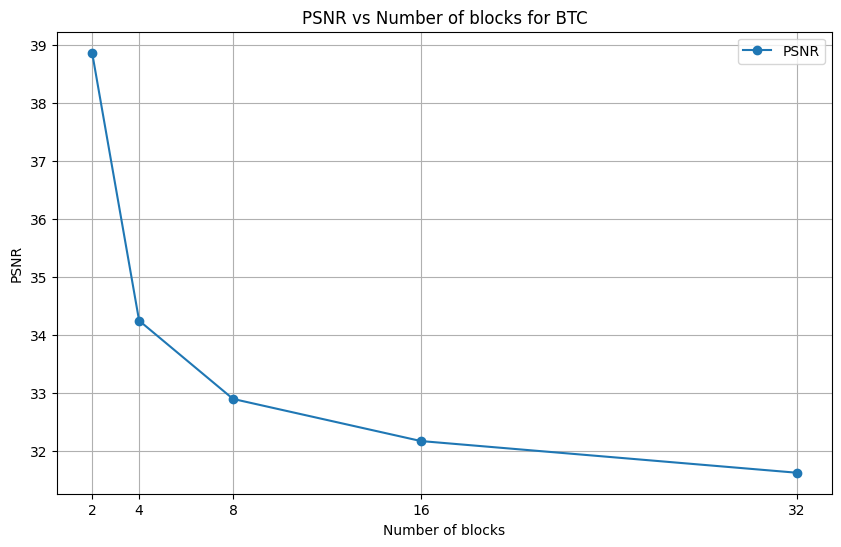

In [55]:
# Plotting the PSNR values against the number of coefficients
plt.figure(figsize=(10, 6))
plt.plot(block_size, psnr_for_btc, marker='o', label='PSNR')
plt.xlabel('Number of blocks')
plt.ylabel('PSNR')
plt.title('PSNR vs Number of blocks for BTC')
plt.xticks(block_size)  # Ensure all x-axis ticks are shown
plt.grid(True)
plt.legend()
plt.show()

# **COLOUR QUANTIZATION**

In [58]:

from PIL import Image
from matplotlib import pyplot as plt
import sys
import numpy as np
import math




IMAGE = []
IMAGE_3D_MATRIX = []


def kmeans_main(cluster_points):
    # rounding pixel values and getting cluster RGB
    centers = []
    for i in range(len(cluster_points)):
        cluster_points[i] = (int(math.floor(cluster_points[i][0])), int(math.floor(cluster_points[i][1])))
        red = IMAGE_3D_MATRIX[cluster_points[i][0]][cluster_points[i][1]][0]
        green = IMAGE_3D_MATRIX[cluster_points[i][0]][cluster_points[i][1]][1]
        blue = IMAGE_3D_MATRIX[cluster_points[i][0]][cluster_points[i][1]][2]
        centers.append([red, blue, green])

    centers = np.array(centers)

    # Initializing class and distance arrays
    classes = np.zeros([IMAGE_3D_MATRIX.shape[0], IMAGE_3D_MATRIX.shape[1]], dtype=np.float64)
    distances = np.zeros([IMAGE_3D_MATRIX.shape[0], IMAGE_3D_MATRIX.shape[1], K], dtype=np.float64)

    for i in range(10):
        # finding distances for each center
        for j in range(K):
            distances[:, :, j] = np.sqrt(((IMAGE_3D_MATRIX - centers[j]) ** 2).sum(axis=2))

        # choosing the minimum distance class for each pixel
        classes = np.argmin(distances, axis=2)

        # rearranging centers
        for c in range(K):
            centers[c] = np.mean(IMAGE_3D_MATRIX[classes == c], 0)

    # changing values with respect to class centers
    for i in range(IMAGE_3D_MATRIX.shape[0]):
        for j in range(IMAGE_3D_MATRIX.shape[1]):
            IMAGE_3D_MATRIX[i][j] = centers[classes[i][j]]



def kmeans_with_random():
    global IMAGE_3D_MATRIX
    points = []
    for i in range(K):
        x = np.random.uniform(0, IMAGE_3D_MATRIX.shape[0])
        y = np.random.uniform(0, IMAGE_3D_MATRIX.shape[1])
        points.append((x, y))

    kmeans_main(points)


def read_image(PATH_TO_FILE):
    global IMAGE, IMAGE_3D_MATRIX
    
    
    # Load an image
    IMAGE = Image.open(PATH_TO_FILE)
  
    IMAGE_3D_MATRIX = np.array(IMAGE).astype(int)





def save_image():
    global IMAGE_3D_MATRIX
    im = Image.fromarray(IMAGE_3D_MATRIX.astype('uint8'))
    im.save('output1.jpg')
K = 32
PATH_TO_FILE = "/kaggle/input/matching/train/st_peters_square/00977754_11239843025.jpg"
read_image(PATH_TO_FILE)
kmeans_with_random()

save_image()


/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/conda/lib/python3.10/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/tmp/ipykernel_33/1768012463.py:40: RuntimeWarning: invalid value encountered in cast
  centers[c] = np.mean(IMAGE_3D_MATRIX[classes == c], 0)


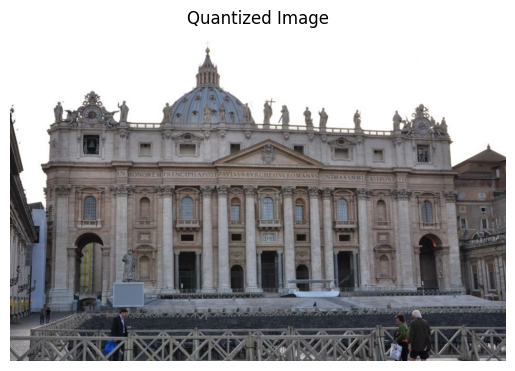

In [59]:
IMAGE = Image.open("/kaggle/input/matching/train/st_peters_square/00977754_11239843025.jpg")
plt.imshow(IMAGE)
plt.title("Original Image")
plt.axis("off")  # Turn off axis labels
plt.show()

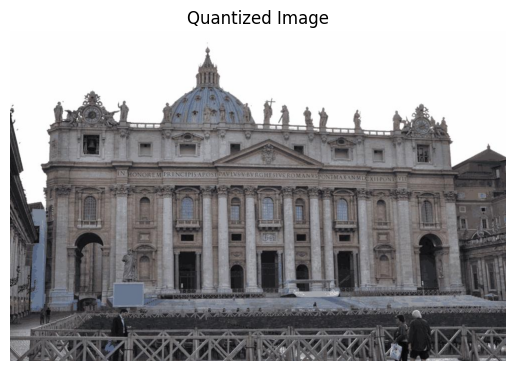

In [60]:
# Load the output image
output_img1 = Image.open("output1.jpg")

# Plot the output image using matplotlib
plt.imshow(output_img1)
plt.title("Quantized Image")
plt.axis("off")  # Turn off axis labels
plt.show()

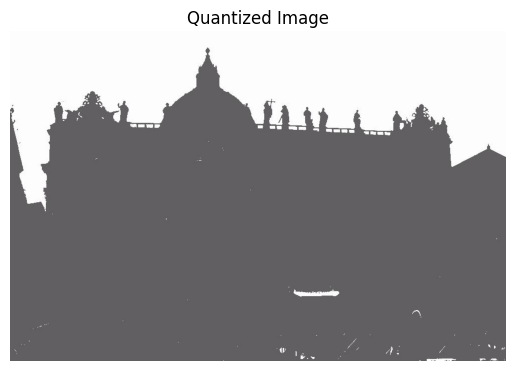

24.5908203125


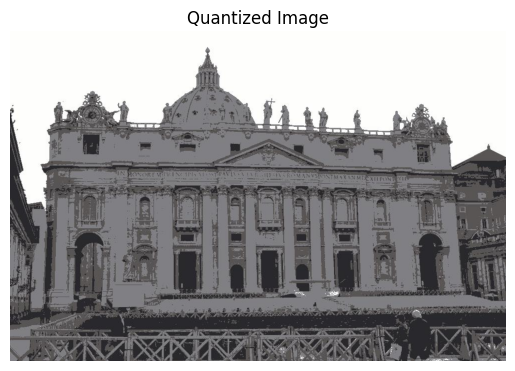

102.6357421875


/tmp/ipykernel_33/1768012463.py:40: RuntimeWarning: invalid value encountered in cast
  centers[c] = np.mean(IMAGE_3D_MATRIX[classes == c], 0)


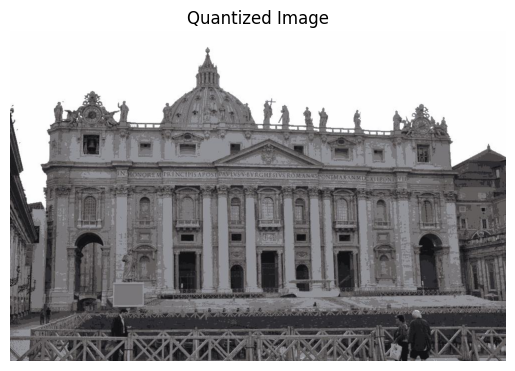

101.5439453125


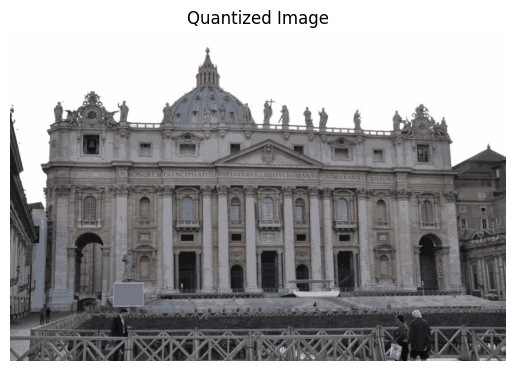

96.078125


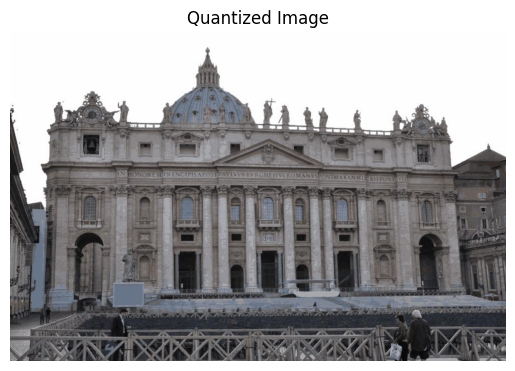

95.884765625


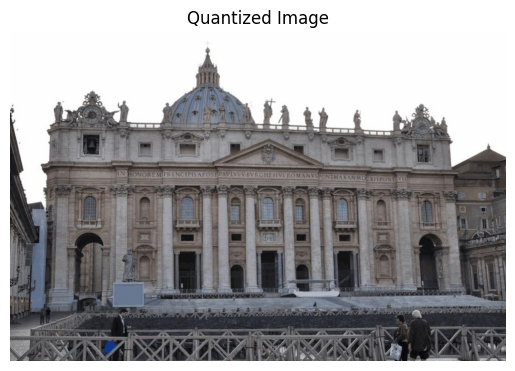

94.017578125


In [72]:
clusters=[2,4,8,16,32,64]
mse_error=[]
ratio=[]
for cluster in clusters:
    K=cluster
    read_image(PATH_TO_FILE)
    kmeans_with_random()

    save_image()
    # Load the output image
    output_img1 = Image.open("output1.jpg")

    # Plot the output image using matplotlib
    plt.imshow(output_img1)
    plt.title("Quantized Image")
    plt.axis("off")  # Turn off axis labels
    plt.show()
        # Convert images to NumPy arrays
    original_array = np.array(IMAGE)
    output_array = np.array(output_img1)
    file_path = 'output1.jpg'
    file_size_kb = os.path.getsize(file_path) / 1024  # Convert bytes to kilobytes
    ratio.append(file_size_original/file_size_kb)
    print(file_size_kb)

    # Calculate the squared differences
    squared_diff = (original_array - output_array) ** 2

    # Calculate the Mean Squared Error (MSE)
    mse = np.mean(squared_diff)
    mse_error.append(mse)
    



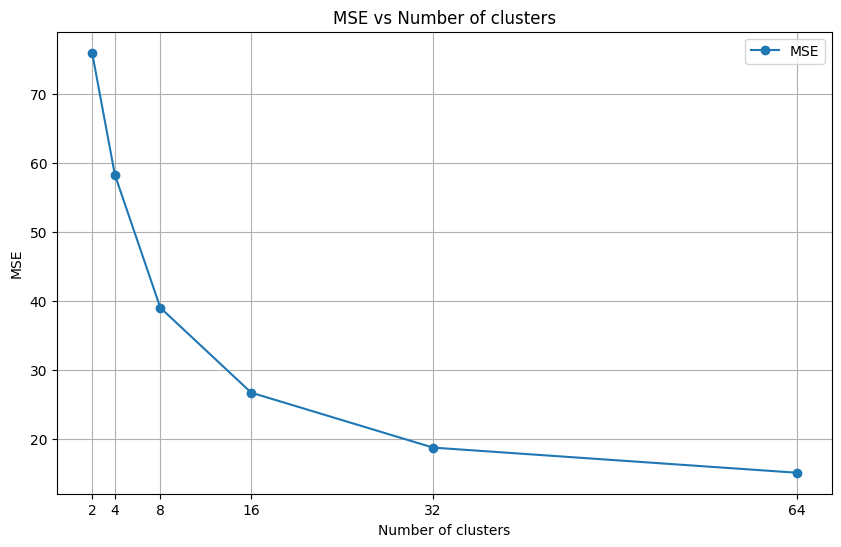

In [70]:

plt.figure(figsize=(10, 6))
plt.plot(clusters, mse_error, marker='o', label='MSE')
plt.xlabel('Number of clusters')
plt.ylabel('MSE')
plt.title('MSE vs Number of clusters')
plt.xticks(clusters)  # Ensure all x-axis ticks are shown
plt.grid(True)
plt.legend()
plt.show()

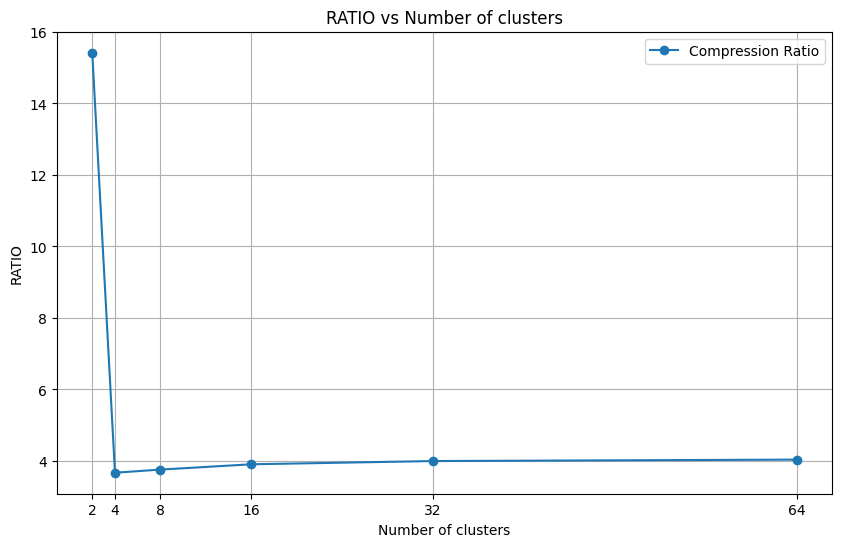

In [71]:

plt.figure(figsize=(10, 6))
plt.plot(clusters, ratio, marker='o', label='Compression Ratio')
plt.xlabel('Number of clusters')
plt.ylabel('RATIO')
plt.title('RATIO vs Number of clusters')
plt.xticks(clusters)  # Ensure all x-axis ticks are shown
plt.grid(True)
plt.legend()
plt.show()

In [61]:
# Convert images to NumPy arrays
original_array = np.array(IMAGE)
output_array = np.array(output_img1)

# Calculate the squared differences
squared_diff = (original_array - output_array) ** 2

# Calculate the Mean Squared Error (MSE)
mse = np.mean(squared_diff)
print(mse)

19.839317110007933


In [67]:
file_path = PATH_TO_FILE
file_size_original = os.path.getsize(file_path) / 1024  # Convert bytes to kilobytes
print(f"Size of original image: {file_size_original:.2f} KB")

Size of original image: 379.19 KB


In [66]:
file_path = 'output1.jpg'
file_size_kb = os.path.getsize(file_path) / 1024  # Convert bytes to kilobytes
print(f"Size of compresses image with '{K=}': {file_size_kb:.2f} KB")

Size of compresses image with 'K=32': 95.51 KB
